# Importing Libraries

In [67]:
import numpy as np
import tensorflow as tf
import io
import os
import glob
import imageio
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.datasets import cifar10,fashion_mnist
from tensorflow.keras.models import Model,Sequential,save_model,load_model,model_from_json
from tensorflow.keras.layers import Conv2D,Conv2DTranspose,Flatten,Dense,Dropout,BatchNormalization,Reshape,LeakyReLU
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.losses import CategoricalCrossentropy,BinaryCrossentropy
%matplotlib inline

# Loading and Preprocessing the dataset

In [2]:
(x_train,y_train),(_,_)=fashion_mnist.load_data()

4423680/4422102 [==============================] - 0s 0us/step


In [3]:
x_train.shape

(60000, 28, 28)

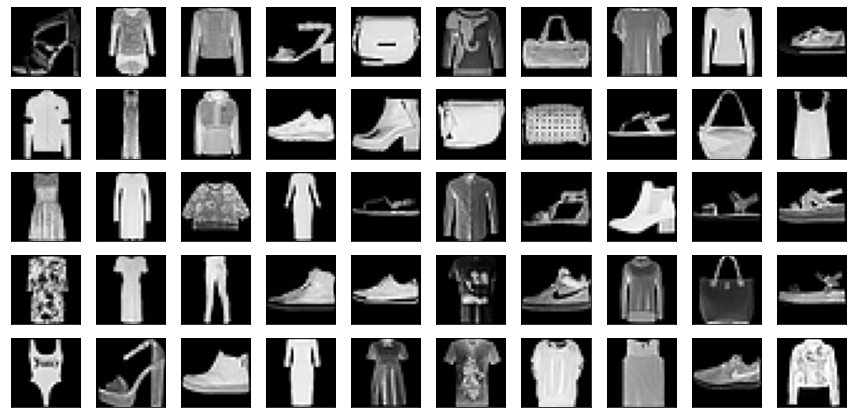

In [5]:
plt.figure(figsize=(15,15)) 

for i in range(50):
    plt.subplot(10,10,i+1)    
    plt.imshow(x_train[np.random.randint(0,60000)],cmap='gray')
    plt.xticks(())
    plt.yticks(())

plt.show()


In [6]:
x_train=x_train.astype('float')

In [7]:
x_train = (x_train - 127.5) / 127.5

In [8]:
x_train=np.expand_dims(x_train,axis=-1)

In [9]:
x_train.shape

(60000, 28, 28, 1)

In [10]:
x_train.min(),x_train.max()

(-1.0, 1.0)

In [11]:
x_train=tf.data.Dataset.from_tensor_slices(x_train).shuffle(1000).batch(64)

# Building Generator and Discriminator Model

In [50]:
def Generator():
  model=Sequential()

  model.add(Dense(7*7*256,input_shape=(256,)))
  model.add(BatchNormalization())
  model.add(LeakyReLU())

  model.add(Reshape((7,7,256)))

  model.add(Conv2DTranspose(128,(3,3),padding='same'))
  model.add(BatchNormalization())
  model.add(LeakyReLU())

  model.add(Conv2DTranspose(64,(5,5),strides=(2,2),padding='same'))
  model.add(BatchNormalization())
  model.add(LeakyReLU())

  model.add(Conv2DTranspose(32,(5,5),strides=(2,2),padding='same'))
  model.add(BatchNormalization())
  model.add(LeakyReLU())

  model.add(Conv2DTranspose(1,(5,5),activation='tanh',padding='same'))

  print(model.summary())

  return model

In [51]:
def Discriminator():

  model=Sequential()

  model.add(Conv2D(32,(3,3),padding='same',input_shape=(28,28,1)))
  model.add(LeakyReLU())
  model.add(Dropout(0.3))

  model.add(Conv2D(64,(5,5),strides=(2,2),padding='same'))
  model.add(LeakyReLU())
  model.add(Dropout(0.3))

  model.add(Conv2D(128,(5,5),strides=(2,2),padding='same'))
  model.add(LeakyReLU())
  model.add(Dropout(0.3))

  model.add(Flatten())

  model.add(Dense(256,activation='relu'))
  model.add(LeakyReLU())
  model.add(Dense(1))

  print(model.summary())
  
  return model

In [52]:
generator=Generator()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 12544)             3223808   
_________________________________________________________________
batch_normalization_8 (Batch (None, 12544)             50176     
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   (None, 12544)             0         
_________________________________________________________________
reshape_2 (Reshape)          (None, 7, 7, 256)         0         
_________________________________________________________________
conv2d_transpose_8 (Conv2DTr (None, 7, 7, 128)         295040    
_________________________________________________________________
batch_normalization_9 (Batch (None, 7, 7, 128)         512       
_________________________________________________________________
leaky_re_lu_21 (LeakyReLU)   (None, 7, 7, 128)        

In [53]:
discriminator=Discriminator()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
leaky_re_lu_24 (LeakyReLU)   (None, 28, 28, 32)        0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 14, 14, 64)        51264     
_________________________________________________________________
leaky_re_lu_25 (LeakyReLU)   (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 7, 7, 128)        

# Checking Initial Generator Output

In [54]:
noise=tf.random.normal([1,256])

In [55]:
output=generator(noise,training=False)

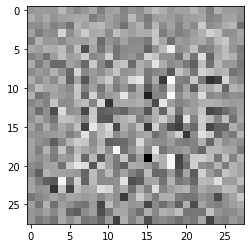

In [56]:
plt.imshow(tf.reshape(output,(28,28)),cmap='gray')

# Defining Generator and Discriminator Loss function


In [57]:
cross_entropy=BinaryCrossentropy(from_logits=True)

In [58]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Defining Helper functions to visualize Generator outputs while training

In [59]:
os.makedirs('images',exist_ok=True)

In [60]:
def image_grid(gen_logits,epoch):
  plt.figure(figsize=(10,10))
  for i in range(64):
    plt.subplot(8,8,i+1)
    plt.xticks(())
    plt.yticks(())
    plt.grid(False)
    plt.imshow(tf.reshape(gen_logits[i],(28,28))*127.5+127.5,cmap='gray')
    plt.savefig('images/image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [72]:
def image_grid_test(gen_logits):
  plt.figure(figsize=(10,10))
  for i in range(64):
    plt.subplot(8,8,i+1)
    plt.xticks(())
    plt.yticks(())
    plt.grid(False)
    plt.imshow(tf.reshape(gen_logits[i],(28,28))*127.5+127.5,cmap='gray')
  plt.show()

In [61]:
def plot_to_image(figure):
  """Converts the matplotlib plot specified by 'figure' to a PNG image and
  returns it. The supplied figure is closed and inaccessible after this call."""
  # Save the plot to a PNG in memory.
  buf = io.BytesIO()
  plt.savefig(buf, format='png')
  # Closing the figure prevents it from being displayed directly inside
  # the notebook.
  plt.close(figure)
  buf.seek(0)
  # Convert PNG buffer to TF image
  image = tf.image.decode_png(buf.getvalue(), channels=4)
  # Add the batch dimension
  image = tf.expand_dims(image, 0)
  return image

# Defining optimizers, train_step and train function

In [62]:
gen_optimizer=tf.keras.optimizers.Adam(learning_rate=0.00005)
dis_optimizer=tf.keras.optimizers.Adam(learning_rate=0.00005)

In [63]:
@tf.function
def train_step(Batch_size,Batch):
    noise=tf.random.normal([Batch_size,256])
    with tf.GradientTape() as gen_tape,tf.GradientTape() as dis_tape:
        gen_logits=generator(noise,training=True)
        dis_logits_real=discriminator(Batch,training=True)
        dis_logits_fake=discriminator(gen_logits,training=True)
        gen_loss=generator_loss(dis_logits_fake)
        dis_loss=discriminator_loss(dis_logits_real,dis_logits_fake)
    gen_gradient=gen_tape.gradient(gen_loss,generator.trainable_variables)
    dis_gradient=dis_tape.gradient(dis_loss,discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gen_gradient,generator.trainable_variables))
    dis_optimizer.apply_gradients(zip(dis_gradient,discriminator.trainable_variables))



In [64]:
test_noise=tf.random.normal([64,256])

In [65]:
def train(epochs):
    for epoch in range(epochs):
        for i,batch in enumerate(x_train):
            train_step(batch.shape[0],batch)
        
        plot_to_image(image_grid(generator(test_noise,training=False),epoch))

# Let's start training the model :)

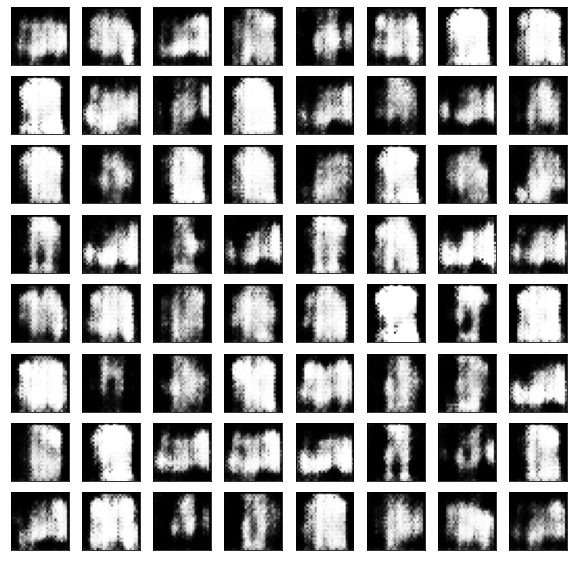

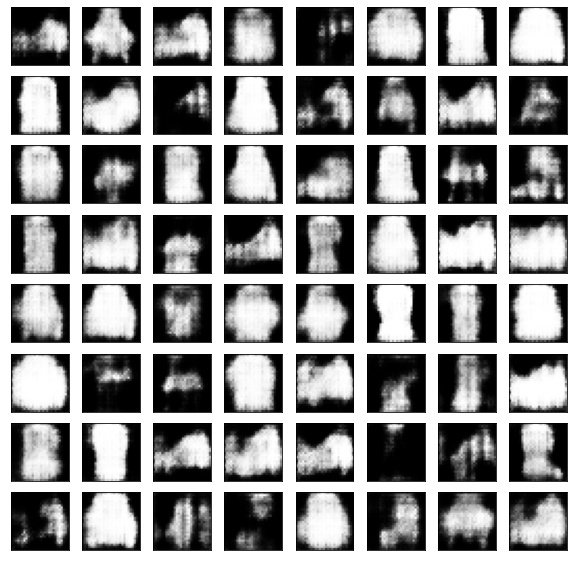

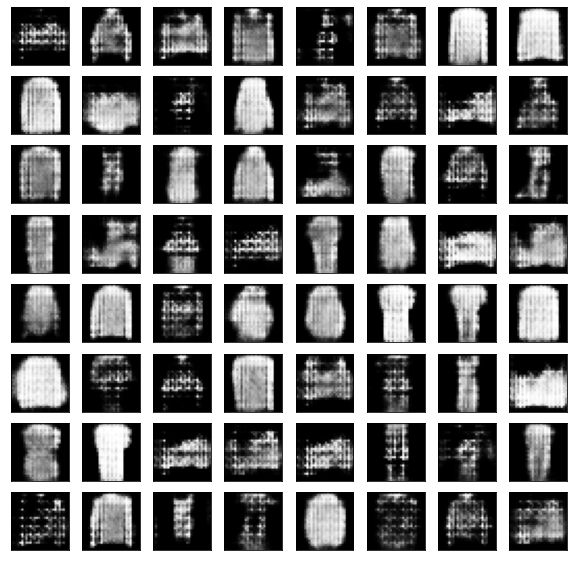

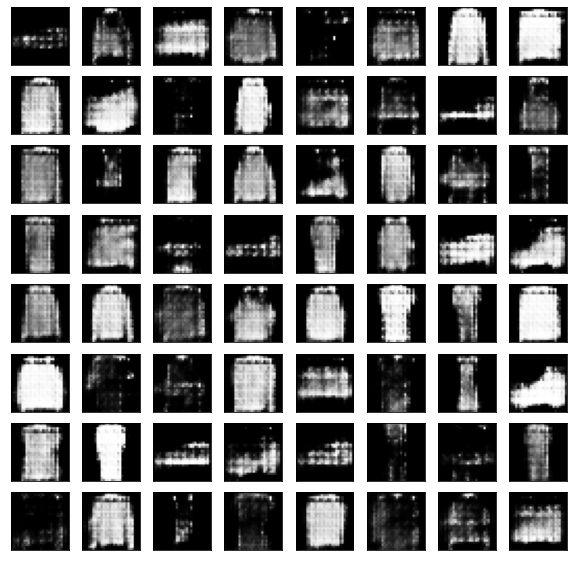

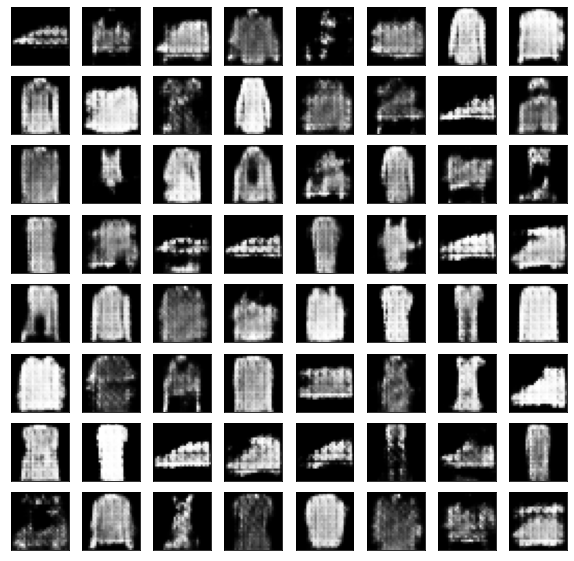

...

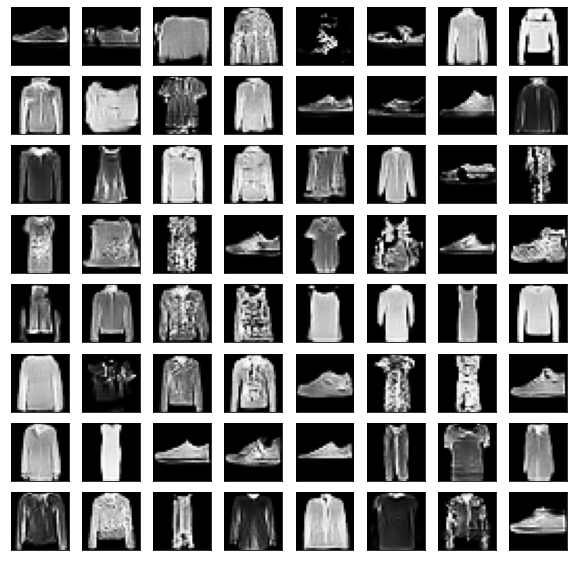

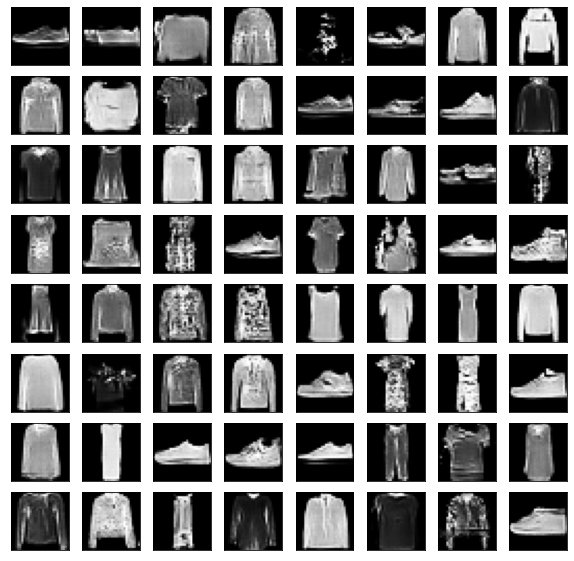

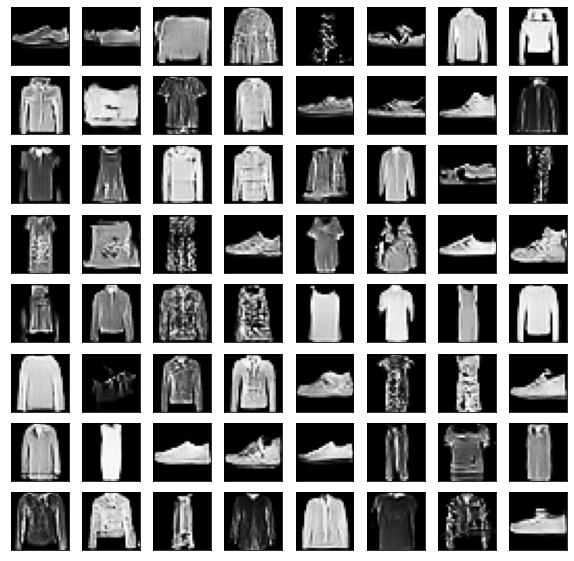

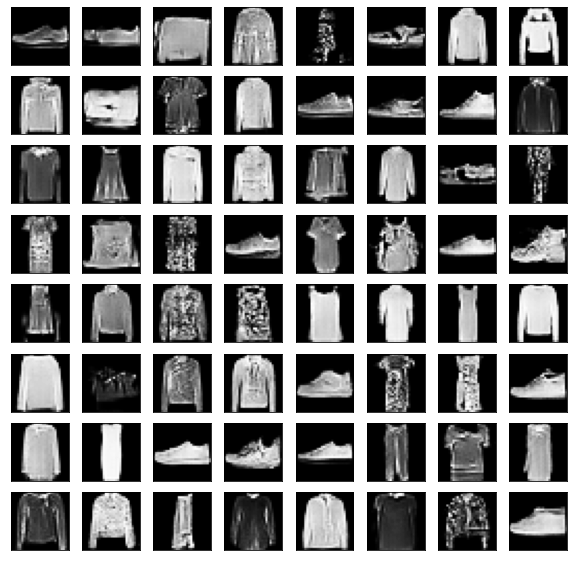

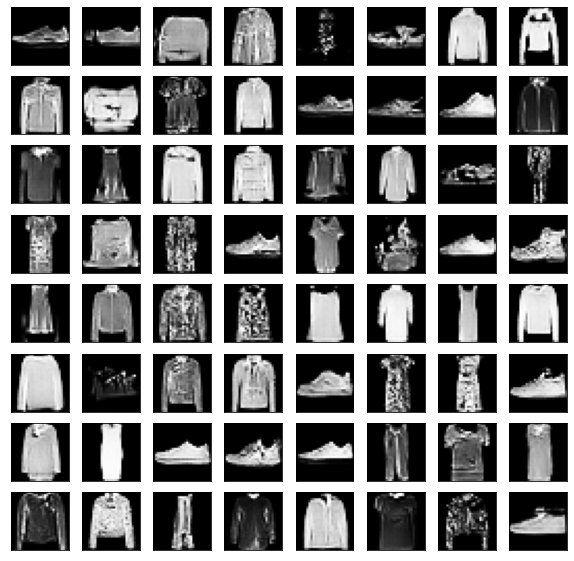

In [66]:
train(50)

# Let's make GIF of the generator outputs while training and also test on new random noise

In [68]:
anim_file = 'DCGAN.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('images/image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [75]:
def create_random_image():
  noise=tf.random.normal([64,256])
  image_grid_test(generator(noise,training=False))

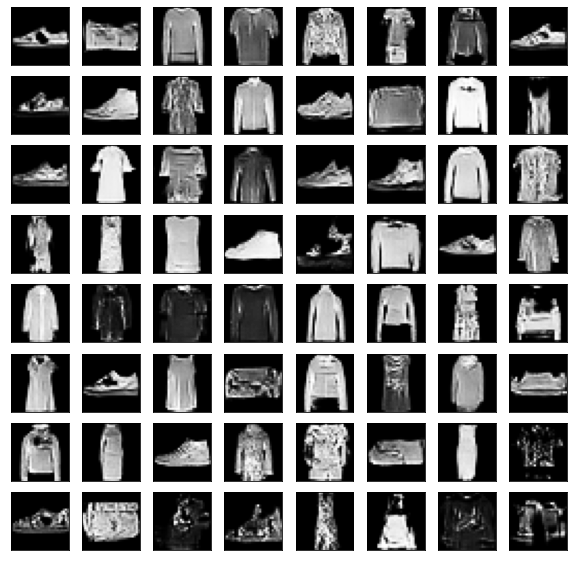

In [77]:
create_random_image()

# Saving the models weight and Architecture


In [78]:
dis_json=discriminator.to_json()
gen_json=generator.to_json()

In [79]:
with open('discriminator.json','w') as file:
  file.write(dis_json)

In [80]:
with open('generator.json','w') as file:
  file.write(gen_json)

In [81]:
save_model(discriminator,'discriminator.hdf5')
save_model(generator,'generator.hdf5')